In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
# %matplotlib notebook
%matplotlib inline

In [3]:
from agent.agent import Agent
from functions import *
from envs import TradingEnv

ModuleNotFoundError: No module named 'ta'

In [105]:
stock_name = '^HSI_2018'
window_size = 15

agent = Agent(window_size, True)
data = getStockDataVec(stock_name)
env = TradingEnv(data, window_size)

In [106]:
len(data)

492

In [107]:
# data

In [108]:
states = [env.get_state(t) for t in range(len(data))]
x_data = np.array(list(range(len(data))))

/Users/Eric/Desktop/QuantRL/DeepQL_Stock_Trader-main/functions.py:22: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))


In [8]:
norms = np.zeros((len(states), len(states)))
for i in range(len(states)):
    for j in range(len(states)):
        norms[i][j] = np.sum((states[i] - states[j]) ** 2)

In [9]:
norms

array([[0.        , 0.24999988, 0.49999988, ..., 3.74889819, 3.74889819,
        3.74889819],
       [0.24999988, 0.        , 1.24999964, ..., 3.49889819, 4.49889794,
        4.49889794],
       [0.49999988, 1.24999964, 0.        , ..., 4.24889819, 3.24889819,
        4.24889794],
       ...,
       [3.74889819, 3.49889819, 4.24889819, ..., 0.        , 7.00000242,
        7.99559032],
       [3.74889819, 4.49889794, 3.24889819, ..., 7.00000242, 0.        ,
        7.00000242],
       [3.74889819, 4.49889794, 4.24889794, ..., 7.99559032, 7.00000242,
        0.        ]])

In [83]:
index = 13
dists = np.array([np.sum((states[index] - states[j]) ** 2) + 1 for j in range(len(states))])

In [11]:
colors = plt.cm.jet(dists)
colors

array([[0.5, 0. , 0. , 1. ],
       [0.5, 0. , 0. , 1. ],
       [0.5, 0. , 0. , 1. ],
       ...,
       [0.5, 0. , 0. , 1. ],
       [0.5, 0. , 0. , 1. ],
       [0.5, 0. , 0. , 1. ]])

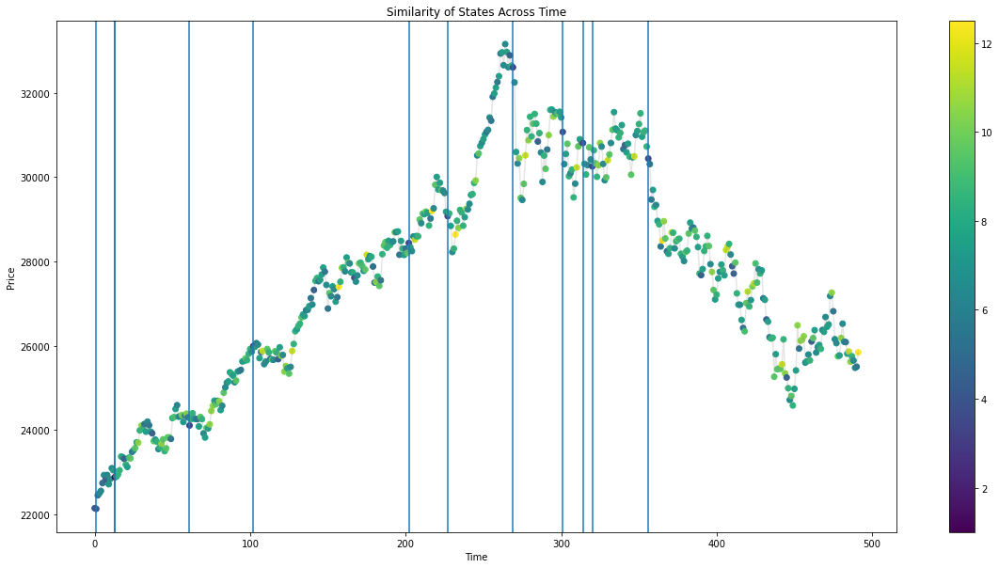

In [30]:
colors = plt.cm.jet(dists)
def color_f(d):
    return colors[d]
inds = np.where(np.array(dists) < 4)[0]
plt.figure(figsize=(20, 10))
plt.plot()
# plt.plot(x_data, dists, '.')
plt.plot(x_data, data, alpha=.2, color="grey")
plt.cm.jet(dists)
for i in inds:
    plt.axvline(i)
plt.scatter(x_data, data, alpha = 1.3, c=dists)
plt.colorbar()
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Similarity of States Across Time")
plt.show()

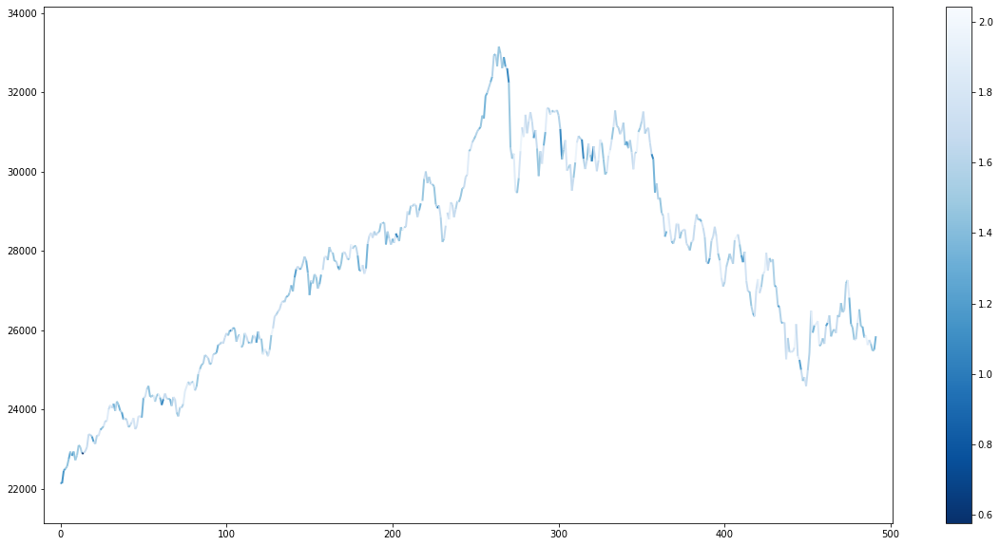

In [133]:
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

colors = plt.cm.jet(np.linspace(0,1,len(dists)))
def color_f(d):
#     print(colors[d])
    return colors[d]
inds = np.where(np.array(dists) < 4)[0]
# plt.figure(figsize=(20, 10))
# plt.plot()
# plt.plot(x_data, data, alpha=.2, color="grey")
plt.cm.jet(dists)
for i in inds:
    continue
#     plt.axvline(i) 

fig, ax = plt.subplots(figsize=(20,10))
ax.set_xlim(min(x_data)-10,max(x_data)+10)
ax.set_ylim(min(data)-1000, max(data)+1000)

points = np.array([x_data, data]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

# Create a continuous norm to map from data points to colors
dists = (np.array([np.sum((states[index] - states[j]) ** 2) + 1 for j in range(len(states))]) / 3) ** 0.5
norm = plt.Normalize(dists.min(), dists.max()) 
color_map = plt.cm.get_cmap('Blues')

lc = LineCollection(segments, cmap=color_map.reversed(), norm=norm)
# Set the values used for colormapping
lc.set_array(dists)
lc.set_linewidth(2)
line = ax.add_collection(lc)
fig.colorbar(line,ax=ax)

plt.show()




# plt.xlabel("Time")
# plt.ylabel("Price")
# plt.title("Similarity of States Across Time")
# plt.show()

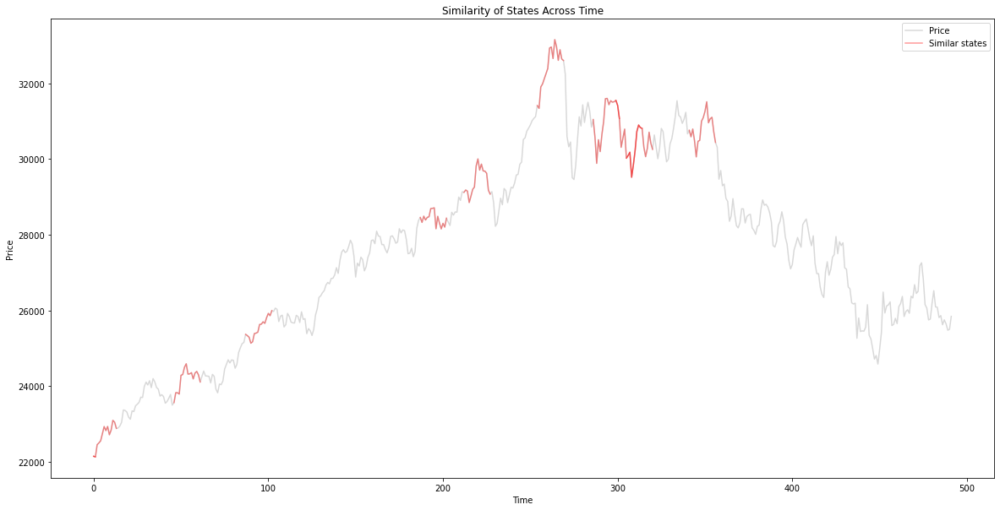

In [66]:
colors = plt.cm.jet(dists)
inds = np.where(np.array(dists) < 4)[0]
plt.figure(figsize=(20, 10))
plt.plot()
# plt.plot(x_data, dists, '.')
plt.plot(x_data, data, alpha=.3, color="grey")
plt.cm.jet(dists)
for i in inds:
    l = max(0,i-window_size)
    plt.plot(x_data[l:i+1], data[l:i+1], alpha=.4, color="red")
    size = 8
#     plt.scatter([l,i], [data[l],data[i]], marker="o", c="black", alpha=.4, s=size)
#     plt.scatter(i, data[i], marker="o", c="black", alpha=.4, s=size)
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Similarity of States Across Time")
plt.legend(["Price", "Similar states"])
# plt.plot(np.linspace(0,10,1))
l = max(0,i-window_size)
model_trend = (np.array(data[l:i+1]) - data[l])*4 + 28000
# plt.plot(np.linspace(l,i+2,(i-l+1)), model_trend, color="blue")
print()
plt.show()

<IPython.core.display.Javascript object>


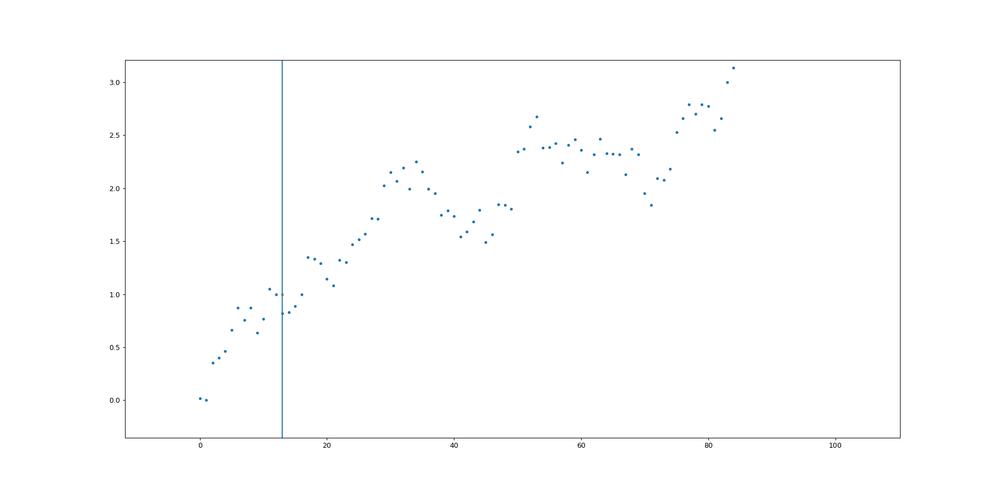

In [75]:
plt.figure(figsize=(20, 10))
plt.ion()
plt.plot(x_data, new_data, '.')
plt.plot(x_data, dists, '.')
plt.axvline(13)


In [1]:
# 100 epochs
one_dataset = [577466.4395870012, 140035.35613599993, 845332.3321580018, 296465.5042610001, 197584.32737899994, 494750.7727179994, 189236.94143600005, 162846.67978899978, 79985.199315, 138631.62147800004, 166137.08409899997, 94594.52648800006, -11247.08987199998, 90364.20847899996, -48194.25352799997, 73013.53931000005, 133798.475942, 32493.168825999946, 128099.349029, 130897.3471459999, 160457.73207700014, 118649.33560500023, 65957.58841800009, 174955.12121600003, 428969.6297670001, 55943.74110100005, 215570.2580370001, 149757.03039100004, -75936.4971729999, 57517.70710999986, 23010.079458999982, 150944.77268799994, 306071.60561900015, 149079.26865499993, 111962.24962599995, 170977.15943499948, 158843.23608399995, 52729.24550100004, 221671.45945999984, -10879.721709000078, 178454.80225299986, 10117984.435951, 10035466.69339201, 10611846.49464801, 10642516.769326996, 9663766.04814801, 10206257.037604015, 10331268.162173014, 10078156.002887007, 10008986.012257999, 10038589.788877018, 34739.56054999996, 5177.779893999981, 20586.783579999956, 9328.717786999947, 35291.419050999975, 11997.328970000046, 26709.501934000087, -21458.592396000102, 34760.507074999994, 21416.229128000043, 633681.4511679993, 44832.08580300002, 25535.098254999906, 196968.26404100007, 601659.1872729996, 699118.3114040003, 167719.06629500003, 512743.95898100105, 805373.5025509993, 198506.63816999996, 797402.1835940005, 1248995.5515400008, 102492.66281599988, 125352.18674399992, 264767.4733810001, 341143.2497550004, 351268.67762200016, 366509.20765899995, 424667.2580529995, 351339.6783509997, 702.4673939999848, 18199.54931900003, 25188.227427999915, 8853.815170000009, -580.8605909999769, 1313.253776999999, 7670.413600999964, 1755.4224819999972, 1992.7448660000446, 11922.645879000003, 188008.8779379998, 560814.1408599999, 70069.89722200003, 398745.26709100005, 335900.40955800004, 506843.93383899954, 391684.0931339996, 772511.4742420001, 253249.48097200014, 205535.6121909999]

In [7]:
from matplotlib import animation, rc
from IPython.display import HTML

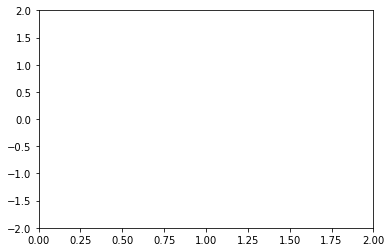

In [8]:
fig, ax = plt.subplots()

ax.set_xlim(( 0, 2))
ax.set_ylim((-2, 2))

line, = ax.plot([], [], lw=2)
def init():
    line.set_data([], [])
    return (line,)

In [20]:
def animate(i):
    x = np.linspace(0, 2, 1000)
    y = np.sin(2 * np.pi * (x - 0.01 * i))
    line.set_data(x, y)
    return (line,)

In [21]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, 
                               blit=True)

In [22]:
HTML(anim.to_jshtml())

In [161]:
import csv

In [162]:
test_name = "^HSI_2018"
test_data = np.array(getStockDataVec(test_name))
l = len(test_data) - 1
x_data = range(l)

In [163]:
df = pd.read_csv('test_progression.csv', header=None, sep='\n')
df = df[0].str.split(',', expand=True).astype(np.float)
df.shape

(202, 416)

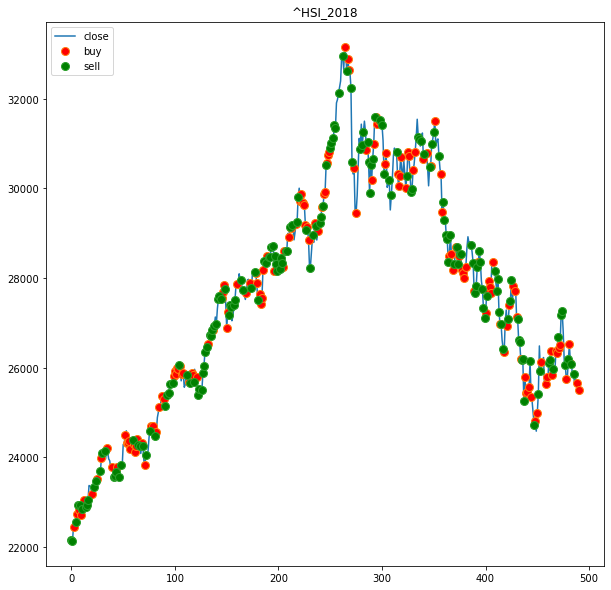

In [164]:
# From here the plotting starts

plt.figure(figsize=(10, 10))
plt.plot(x_data, test_data[:-1])

plt.title(test_name)

i = 0
for col, row in df.iterrows():
    indices = row.to_numpy()
    indices = indices[np.isfinite(indices)].astype(int)
    if (i % 2 == 0):
        plt.plot(indices, test_data[indices], '.',marker='o',markersize=8, markerfacecolor='r')
    else:
        plt.plot(indices, test_data[indices], '.',marker='o', markersize=8, markerfacecolor='g')
    if i == 1:
        break
    i+= 1
plt.legend(['close', 'buy', 'sell'], loc='upper left')


textstr = '\n'.join((
    r'$\epsilon=%.4f$' % (eps, ),
    r'$\mathrm{median}=%.2f$' % (median, ),
    r'$\sigma=%.2f$' % (sigma, )))

props = dict(boxstyle='round', facecolor='gray', alpha=0.5)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

plt.show()

In [165]:
row = df[:1].to_numpy()
print(df)

      0     1     2     3     4     5     6      7      8      9    ...  \
0     2.0   5.0   7.0   9.0  12.0  13.0  20.0   25.0   29.0   34.0  ...   
1     0.0   1.0   4.0   6.0   8.0  10.0  14.0   15.0   16.0   22.0  ...   
2     3.0   5.0   6.0   7.0  12.0  14.0  17.0   18.0   19.0   24.0  ...   
3     0.0  10.0  11.0  16.0  22.0  25.0  29.0   31.0   33.0   34.0  ...   
4     0.0   1.0   2.0   4.0   7.0   8.0  10.0   11.0   13.0   15.0  ...   
..    ...   ...   ...   ...   ...   ...   ...    ...    ...    ...  ...   
197   1.0   2.0   3.0   4.0   5.0   6.0   8.0    9.0   10.0   11.0  ...   
198   3.0   9.0  28.0  37.0  43.0  53.0  61.0   62.0   64.0   66.0  ...   
199   0.0   1.0   2.0   4.0   5.0   6.0   7.0    8.0   10.0   11.0  ...   
200  25.0  31.0  43.0  44.0  47.0  60.0  77.0  117.0  119.0  129.0  ...   
201   0.0   1.0   2.0   3.0   4.0   6.0   7.0    8.0    9.0   10.0  ...   

       406    407    408    409    410    411    412    413    414    415  
0      NaN    NaN    Na

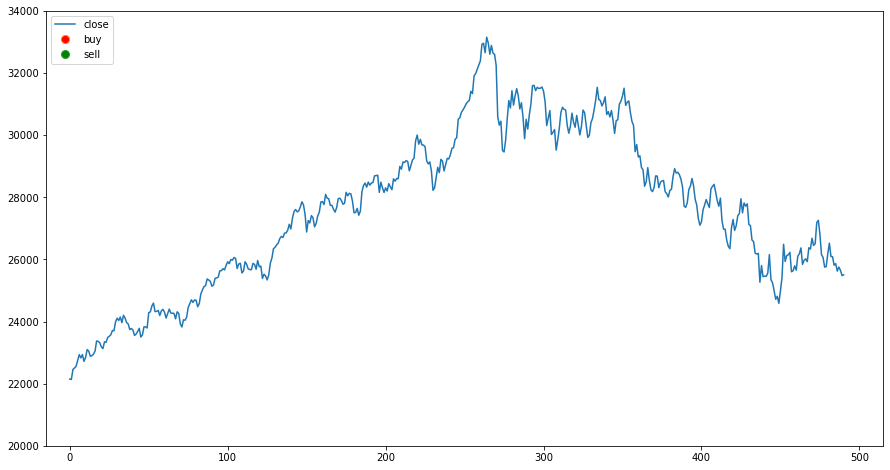

In [166]:
fig, ax = plt.subplots(figsize=(15,8))

ax.set_xlim(( -15, 515))
ax.set_ylim((20000, 34000))



close_plot, = ax.plot(x_data, test_data[:-1])
buys_plot, = ax.plot([], [], '.',marker='o',markersize=8, markerfacecolor='r')
sells_plot, = ax.plot([],[], '.',marker='o',markersize=8, markerfacecolor='g')



ax.legend(['close', 'buy', 'sell'], loc='upper left')


def init():
    buys_plot.set_data([], [])
    sells_plot.set_data([],[])
    return (close_plot, buys_plot,sells_plot)

In [167]:
def animate(i):
    ax.set_title("Episode " + str(i) + " / " + str(df.shape[0] // 2))
    i *= 2
    buys = df[i:i+1].to_numpy()
    sells = df[i+1:i+2].to_numpy()
    buys = buys[np.isfinite(buys)].astype(int)
    sells = sells[np.isfinite(sells)].astype(int)
    sells_plot.set_data(sells,test_data[sells])
    buys_plot.set_data(buys,test_data[buys])
    return (close_plot, buys_plot,sells_plot)

In [168]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=int(df.shape[0]/2), interval=50, 
                               blit=True)

In [169]:
HTML(anim.to_jshtml())

In [170]:
one_profit_list = [(677968.5959490009, 42.607551358588516), (598424.2907779999, 83.58937307355781), (556995.2330090009, 81.54627066797262), (227445.2307249996, 43.01157777433111), (115048.91127199994, 18.584192025699902), (248904.36811799975, 135.84806639727762), (212516.07996899995, 92.14809270547335), (-7219.065888999983, -2.0315210224290774), (170449.7365750002, 43.438038680567686), (333750.9492260001, 97.86777786604468), (78661.11111400003, 23.937134137263786), (412090.93197700055, 123.09233737687634), (408525.9863330001, 53.48903356835946), (173134.965928, 52.033052836658925), (54450.03869799991, 7.1196813722277), (-103754.79456600006, -18.18096186174935), (453777.51746399986, 70.22145026433651), (345397.6450249995, 73.73373952709856), (41369.27900699994, 9.674951687125901), (214537.57166299984, 63.45165375727475), (151647.19045299984, 69.3006384622174), (8878509.856012993, 52.617540274488114), (9240670.600615, 53.78879300240612), (9435217.455728004, 52.12783834211948), (9041980.87809, 45.380656093513736), (9816058.602482012, 60.085569580126915), (10038817.860999992, 51.743068712363325), (10223229.760025, 50.38886270803802), (9813630.63227, 45.621954316109026), (9818626.150535999, 45.093280025926774), (9507740.362364002, 44.46008881500652), (45662.29675699989, 28.41615732502577), (44714.653073999994, 34.73389609854461), (99387.60826499993, 58.70437705078274), (651.0062139999973, 0.29896575397028674), (24433.602692999946, 12.585679952416227), (59791.56322500008, 32.23831209221235), (33575.311409999966, 24.480434013489788), (-2262.1875980000004, -1.2334781984729088), (19413.977435999994, 13.932455231015739), (46997.248805999945, 41.5014847140472), (10228.209102000006, 8.947459761219566), (14016.319803999966, 14.128459968792365), (34765.96701499999, 22.987224688274885), (-28160.787109000008, -20.599238099898834), (-19807.066558000006, -10.945901178511523), (-17309.565794000002, -6.059511153465474), (32195.865987000027, 30.32733512492754), (44067.93516800008, 49.32349067054743), (-6637.297994999986, -3.184172721211979), (-841.6591819999685, -0.6155226296393483), (57787.77491599998, 57.10385779864916), (9606.332657999961, 5.432049938899759), (15810.539282000067, 9.273594283712884), (23490.71252000002, 11.088120255680375), (-21709.44249599996, -11.042924213758399), (35814.867080000025, 31.541229436687352), (8862.502704999959, 2.7632326262331164), (10152.991930000024, 7.845745079254075), (24285.756710000063, 20.289834808603572), (24516.176522000053, 19.005070677962607), (17247.050806999985, 15.427028178259828), (15797.323268999968, 10.67484621829206), (-7197.33336200001, -6.983211765116226), (-6163.859231999935, -5.777542189355161), (17939.23584199997, 10.3918720311451), (17954.533193000025, 14.616339174523082), (-5226.92321399998, -5.199415292481763), (13770.034667999955, 11.92086925386519), (-6772.012324000038, -7.374275400700194), (21791.76979199997, 22.237081300364892), (11138130.975883003, 20.922247845276402), (10578123.038630005, 19.423122643054157), (10989333.836359004, 20.196606219336484), (10776154.488332016, 19.39645539329548), (10934555.548745997, 19.747809367642564), (10646782.541180002, 18.70081872902442), (10698460.385051, 19.312154988213), (10441895.761643015, 18.056448911290925), (10590654.12225201, 18.334682004450535), (10414171.930702006, 17.857677155383545), (9114.025894000017, 14.002573110287026), (2936.029762000052, 3.4541473625957546), (-1098.6564880000096, -1.1692650927760855), (3546.0404059999873, 4.465342505445589), (-10390.591063999993, -13.530203889541607), (7422.430900999994, 8.515183697049617), (13361.320457000014, 14.672071160341158), (13977.34459, 24.497458071049824), (7002.594486999933, 8.92884474869769), (8311.401616999976, 12.609883668624683), (2871141.648938, 58.99698969535822), (3617644.575079003, 64.90674885620726), (2654884.364611002, 54.2760421244179), (3260434.2701560026, 54.16540037549142), (2558970.6694460027, 40.49787294075614), (3455203.589611003, 62.309488216411424), (3218792.8689019983, 60.8451730780727), (2834296.036875999, 44.163391505135884), (3413930.035286999, 62.19161351535237), (3387594.8590180017, 59.682557588939034), (5838.79467600001, 10.03235364991529), (-2490.3354340000296, -2.8529734485275675), (410.60472299999674, 0.5488146961587845), (-2147.1595309999657, -3.650611125573332), (-328.28686499995, -0.47250915633691726), (4011.7470639999865, 9.163387903744376), (-5396.274901000027, -8.900586612764881), (-291.8449630000255, -0.5429196185308163), (3355.5380840000053, 6.44762604132029), (-6799.901608999997, -8.407455019396403), (1730.0815420000145, 2.942391072943157), (-160.38952300000028, -0.2919955770249967), (290.2320510000154, 0.5742615459169486), (1614.5234460000056, 2.930186783558762), (-9.648429000028955, -0.018654218710453713), (1016.2263160000234, 2.258743614710241), (3236.156493000035, 7.468863660877751), (-1585.3432630000007, -3.369657041403735), (-541.354246000014, -1.1556346170330551), (-4994.504150999981, -9.676028422135982), (11630730.48209602, 17.820220841247302), (11410327.39983501, 17.335746253551523), (11582050.466360997, 17.62491838043173), (10893655.77507101, 15.950815110436498), (11478030.51213201, 17.20182076220004), (11275368.603692003, 16.747181119520366), (11022526.963058008, 16.051472696147602), (10697026.112965005, 15.328616041007528), (11046038.688160012, 15.923363997293375), (10890660.007984007, 15.55011735092518), (57947.581172000006, 70.92462447204029), (39254.518191999996, 25.65881686720862), (57326.89965700001, 213.83373154470053), (7511.159787999994, 10.640676410537083), (64754.051637, 309.8695071665819), (36564.508422000006, 61.05536455998733), (88427.408692, 109.41790769918791), (38158.855345, 26.268651062046306), (111204.362185, 88.04260051664204), (39386.060916, 62.900894806365784), (-420.5170880000087, -1.6860124687536753), (-1079.4624059999896, -4.305750213067588), (-193.46191199999885, -0.8271614680666615), (-2524.5883779999976, -9.686625573833757), (417.89233600000216, 1.5951270993017435), (910.7871100000002, 3.8604268340937957), (730.8820809999975, 3.09415134156863), (-702.5517580000014, -2.4605145686292986), (-1690.7263169999965, -6.419734177251339), (43.53198399999883, 0.1845742529209395), (574.3488809999908, 1.3671353745800319), (2827.5444379999867, 7.042796472743089), (1431.625492999991, 3.4456022092099365), (1585.3063969999948, 3.8301423401542287), (533.7719769999944, 1.2576560727978061), (-382.292234000005, -0.875204089849507), (845.5217289999946, 2.0069322524448734), (2076.37964199999, 5.082497438593746), (1548.5100109999985, 3.7676551515071948), (1935.9846239999933, 4.717357962562775), (11052377.06659101, 73.0836538661107), (11227960.659361005, 72.08162806568745), (11045779.096858995, 72.21266628982283), (11082358.773868004, 73.93410524434199), (11042079.49066098, 70.69558654308977), (11266911.232113982, 72.88211489173446), (10992408.11151401, 71.63019387651602), (11179729.945498997, 71.42128172336388), (11181724.738463, 71.34086426861298), (11167944.602720976, 71.48290026715765), (217366.148438, 0.21975112228032295), (225402.208255, 0.22828563535777333), (281972.24170099996, 0.28565562446933895), (289930.466312, 0.2937254754435082), (236687.73974799996, 0.2394884266988052), (314626.93212899996, 0.3189188311289181), (376517.888185, 0.38271974641524864), (272997.21875299996, 0.27680775355746184), (281097.90088, 0.2848333883395228), (321138.79345700005, 0.3253518677547669), (-797.8691389999922, -2.807748384440459), (1620.021973000009, 5.52437537589074), (-1696.7318109999965, -5.855671178659508), (1587.9716799999978, 5.945239752034878), (488.4401879999955, 1.8003440635537185), (-1503.957030999998, -5.232291278765129), (-540.2004389999979, -1.927454126919311), (-25.85485799999742, -0.0924840998416136), (1419.9077170000028, 5.419720042948621), (454.86254799999506, 1.6901245822315578), (280249.56702, 0.4947854253710033), (218957.94751199998, 0.3864559361477559), (252475.109741, 0.4461719995705166), (208729.79748699997, 0.3676262820651078), (282491.77649300004, 0.5000036268902426), (242546.9823, 0.428121695349927), (284276.762086, 0.5023556646500474), (328634.004519, 0.5821137774923013), (267354.062865, 0.47165401257181205), (208526.356812, 0.36792035668946327), (-34707.75854499996, -9.685561925634165), (-25189.759765, -7.669272526330473), (-38307.14624299995, -10.656732849426378), (-18880.62133099998, -5.532280902527093), (-32713.70092499997, -9.197034836738258), (-29520.211424000023, -8.399890293846678), (-45668.48510599995, -11.8243494839117), (-41481.74731599995, -11.37542255000029), (-33328.56323299998, -9.365004586125561), (-24360.33325199997, -7.914052114317631), (16136.269530000009, 48.81914301950483), (42467.36108300001, 110.68539292815063), (-1599.6090129999866, -3.42115749099496), (18485.022947000005, 32.73811593153843), (27675.239498000006, 102.65482563217296), (33304.160149999996, 52.195633737928695), (-4932.880618999991, -6.73824778205419), (25375.059813, 94.0962986414679), (12958.996581999996, 22.568595987525118), (21546.561523000008, 29.06199326418104), (230554.571534, 0.2331478597986907), (179844.91040199998, 0.18175247830577776), (255997.427981, 0.25909683703875863), (189717.39086999994, 0.1916351133829166), (216284.031741, 0.21884841956759665), (385663.510989, 0.39144111066386705), (298967.070072, 0.3028879478284013), (313777.90894, 0.3179984525060599), (282737.650881, 0.28667559080559873), (273427.737555, 0.27715858599197163), (10008.349610000005, 36.472684252142706), (-7123.337646999993, -13.82024940645448), (2955.0117190000046, 8.835093078243142), (31353.011230000004, 55.482372998288895), (-7476.812012000004, -7.291953478635679), (2803.4700950000006, 7.338464201885615), (2208.9418940000123, 5.270747631397894), (5504.140380999996, 22.48248893219116), (14435.170657000002, 48.142511521373585), (2159.7473180000015, 7.286862002292553), (-6374.648041000022, -2.7769437526635987), (-1726.6231369999714, -0.874504612204146), (-14320.684659999974, -6.637107932290137), (-21289.177825999996, -9.622315135100417), (-10158.638275000008, -4.446615369248782), (-24347.923917000026, -10.240759608401612), (-9810.399994999956, -4.639016587225958), (-363.83334400000604, -0.1802338969624252), (-9031.208097999974, -3.611173834529931), (-15733.013033000021, -6.706089633555831), (3260635.2273180014, 4.44672718358687), (3243359.3664789996, 4.427803722649894), (3217048.1897200025, 4.392979725264365), (3369994.628932001, 4.613684929482224), (3272322.2507580016, 4.467717896129546), (3152284.480738, 4.291291139138805), (3208268.218286001, 4.367202855368778), (3270692.230739002, 4.466706411546008), (3357520.728300001, 4.60084831331492), (3195895.920923, 4.358668189288965), (-3113.8901389999983, -11.22389918246753), (-131.77904800000715, -0.5806671855847773), (1859.450684999997, 7.000053184083951), (341.01416199999676, 1.47526715582707), (-1218.090577999999, -5.096067168823834), (228.86279399999876, 0.9732883616954365), (265.6020520000038, 1.1507355443689176), (-1094.2675769999905, -3.950851241789756), (886.1992189999964, 3.898216827243094), (944.1569859999959, 4.076594732873778), (332568.029544, 0.337965604393851), (474834.39135700016, 0.48410736095269286), (372136.461919, 0.37836412736140634), (535785.760011, 0.5468787603306415), (365626.47095, 0.37227680992559686), (556792.710694, 0.5696500498361611), (459826.71851, 0.468433408453734), (410882.2033699999, 0.41819613350932733), (459666.1115750001, 0.467955827972312), (399991.89038299996, 0.4071045481225514), (-874.4230959999877, -0.980617956465286), (4618.977785000003, 5.451793508569399), (-3121.300540999984, -4.344329046855674), (3050.880612000015, 4.3955488885711524), (2728.406736000019, 2.999049789935335), (11915.81030100001, 15.040289380168337), (5498.270995000015, 6.256481492436955), (5407.925535000026, 6.39367822802411), (1557.1542960000115, 1.6831512865272242), (3805.553220000007, 4.249430027027827), (1764905.6812920007, 107.60890010962709), (1838094.6161030007, 102.96551863377023), (1946692.416639003, 111.19904383613853), (1769441.3014099991, 104.71795421795002), (1890315.664447, 97.20856178710999), (2018922.3490139984, 114.76945772831225), (1691468.3868539978, 99.85394189435341), (1876113.4095599991, 104.79427878365435), (1933780.760634999, 109.95103845437808), (1766878.8907619987, 105.09857174850869), (541.6660160000038, 2.264145245677417), (1465.8986779999937, 6.718555051701522), (1268.699216000011, 5.354184484431036), (-493.75854500000924, -2.0035821934747573), (-1413.309325000008, -5.654459027523317), (-786.2705060000044, -1.8916630545313378), (-179.9587450000049, -0.7856494562752099), (338.57226599999467, 1.1292058695332523), (364.71630899999127, 1.304821455421706), (1444.3837840000024, 3.707816293139469), (-36170.786979000004, -7.262646604167388), (-50400.953605999974, -9.83870875228085), (-41949.40612099997, -7.988610927688475), (-51845.295035000025, -9.744517750451157), (-45202.135615000014, -9.316054778667066), (-45134.191280000035, -9.004726378726025), (-35819.74620999999, -7.875430658322437), (-44168.08263400001, -8.37839510627154), (-46082.23668799998, -9.426662681830194), (-48923.63707800008, -10.001372170679554), (5381847.131612016, 50.53712653885065), (5387801.903330999, 51.581760707803305), (5314420.789318011, 51.28598365334083), (5606743.975602004, 51.48516741852441), (5339255.257582007, 50.32764855456254), (5152938.849861991, 50.005456735148194), (5499637.585218006, 51.60180907178346), (5399645.4707169905, 50.37027096987446), (5371014.953874998, 51.3097850683732), (5412161.082775992, 51.82114543997394), (-787.5205089999981, -2.8754720923712696), (-677.7487810000061, -2.8223600778836766), (592.5712890000041, 2.5670806685829057), (2049.50073499999, 8.058710258743004), (844.8085969999975, 3.593741744864282), (472.2871080000041, 2.047153323133631), (450.25683400001435, 1.6859873479984966), (1274.4407930000075, 5.112001167955111), (-4.50769099999934, -0.01843203672984526)]